# Seminar 1. EEG analysis

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/adasegroup/NEUROML2020/blob/seminar1/seminar1/seminar1-working-with-eeg.ipynb)

**Plan**

1. Read and preprocess the data
2. Use ICA for noise reduction
3. Compute ERP
4. Plot topomaps for ERP
5. Compute beta band envelopes for ERP
6. Compute coherence

In [ ]:
# For Colab only
#!pip install mne
# !pip install mne-connectivity

In [4]:
# !wget "https://www.physionet.org/files/eegmmidb/1.0.0/S003/S003R03.edf"

In [5]:
# !wget "https://www.physionet.org/files/eegmmidb/1.0.0/S003/S003R03.edf.event"

In [6]:
# !ls

In [1]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
import mne_connectivity

C:\Users\Alexander\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
C:\Users\Alexander\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (


In [2]:
%matplotlib notebook

mne.io includes the funtions for different EEG-record formats

Optional To Do
File formats (EDF, FIFF)

In [3]:
sample = mne.io.read_raw_edf('S003R03.edf', verbose=False, preload=True)

Get some info about a record

In [4]:
sample.info

Measurement date,"August 12, 2009 16:15:00 GMT"
Experimenter,Unknown
Participant,X
Digitized points,Not available
Good channels,64 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,160.00 Hz
Highpass,0.00 Hz
Lowpass,80.00 Hz


In [5]:
# Sampling frequency
sample.info['sfreq']

160.0

In [6]:
# Length in seconds
len(sample) / sample.info['sfreq']

125.0

In [7]:
# Number of channels
len(sample.ch_names)

64

## Channel selection and adding a montage

In [8]:
sample.ch_names[:3]

['Fc5.', 'Fc3.', 'Fc1.']

In [9]:
# fix trailing dots in channel names
# use sample.rename_channels(map)

# YOUR CODE HERE
sample.rename_channels(lambda x: x.replace('.', ''))

Measurement date,"August 12, 2009 16:15:00 GMT"
Experimenter,Unknown
Participant,X
Digitized points,Not available
Good channels,64 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,160.00 Hz
Highpass,0.00 Hz
Lowpass,80.00 Hz


In [10]:
sample.ch_names[:3]

['Fc5', 'Fc3', 'Fc1']

In [11]:
sample.ch_names

['Fc5',
 'Fc3',
 'Fc1',
 'Fcz',
 'Fc2',
 'Fc4',
 'Fc6',
 'C5',
 'C3',
 'C1',
 'Cz',
 'C2',
 'C4',
 'C6',
 'Cp5',
 'Cp3',
 'Cp1',
 'Cpz',
 'Cp2',
 'Cp4',
 'Cp6',
 'Fp1',
 'Fpz',
 'Fp2',
 'Af7',
 'Af3',
 'Afz',
 'Af4',
 'Af8',
 'F7',
 'F5',
 'F3',
 'F1',
 'Fz',
 'F2',
 'F4',
 'F6',
 'F8',
 'Ft7',
 'Ft8',
 'T7',
 'T8',
 'T9',
 'T10',
 'Tp7',
 'Tp8',
 'P7',
 'P5',
 'P3',
 'P1',
 'Pz',
 'P2',
 'P4',
 'P6',
 'P8',
 'Po7',
 'Po3',
 'Poz',
 'Po4',
 'Po8',
 'O1',
 'Oz',
 'O2',
 'Iz']

In [12]:
# 19 channels from 10-20. no A1 and A2 here
# Be careful. Pure 10-20 labeling differs from high-resolution montages
# In MNE, 10-20 montage is actually an extended high-resulution version of 10-20
# FYI, mapping from pure 10-20 to high-resolution versions
# T3 = T7
# T4 = T8
# T5 = P7
# T6 = P8

channels_to_use = [
    # prefrontal
    'Fp1',
    'Fp2',
    # frontal
    'F7',
    'F3',
    'F4',
    'Fz',
    'F8',
    # central and temporal
    'T7',
    'C3',
    'Cz',
    'C4',
    'T8',
    # parietal
    'P7',
    'P3',
    'Pz',
    'P4',
    'P8',
    # occipital
    'O1',
    'O2',
]

In [13]:
sample_1020 = sample.copy().pick_channels(channels_to_use)

# check that everything is OK
assert len(channels_to_use) == len(sample_1020.ch_names)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


In [14]:
ch_map = {ch.lower(): ch for ch in sample_1020.ch_names}

In [15]:
ten_twenty_montage = mne.channels.make_standard_montage('standard_1020')
len(ten_twenty_montage.ch_names)

94

In [16]:
ten_twenty_montage.ch_names = [ch_map[ch.lower()] if ch.lower() in ch_map else ch 
                               for ch in ten_twenty_montage.ch_names]

In [17]:
sample_1020.set_montage(ten_twenty_montage)

Measurement date,"August 12, 2009 16:15:00 GMT"
Experimenter,Unknown
Participant,X
Digitized points,22 points
Good channels,19 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,160.00 Hz
Highpass,0.00 Hz
Lowpass,80.00 Hz


<IPython.core.display.Javascript object>


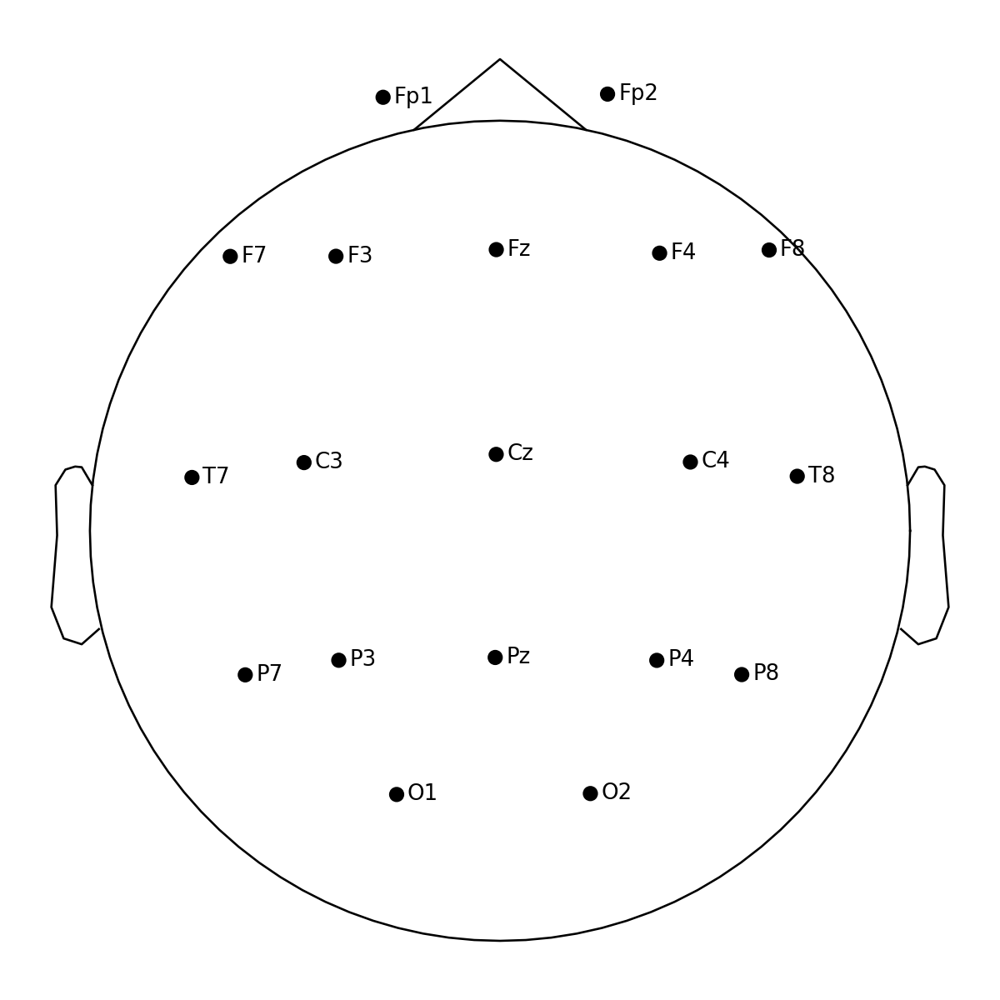

In [18]:
sample_1020.plot_sensors(show_names=True);

## Explore the signals

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Effective window size : 12.800 (s)
Plotting power spectral density (dB=True).


C:\Users\ALEXAN~1\AppData\Local\Temp/ipykernel_19568/3346483182.py:1: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  sample_1020.plot_psd();


<IPython.core.display.Javascript object>


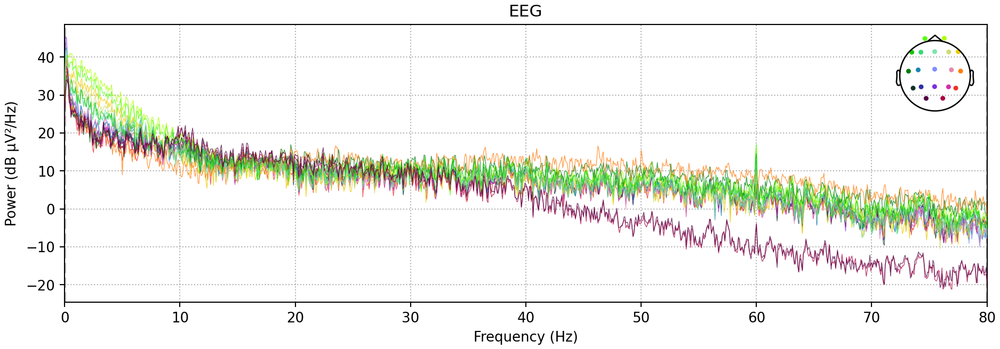

In [19]:
sample_1020.plot_psd();

### Band-pass filtering

It's better to remove low-freq components < 1 Hz and high-freq > 50Hz (non-informative for EEG)

Let's use 4-th order Butterworth filter (default IIR filter)

In [20]:
sample_1020.filter(l_freq=1, h_freq=50, method='iir')

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 50.00 Hz: -6.02, -6.02 dB



Measurement date,"August 12, 2009 16:15:00 GMT"
Experimenter,Unknown
Participant,X
Digitized points,22 points
Good channels,19 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,160.00 Hz
Highpass,1.00 Hz
Lowpass,50.00 Hz


In [21]:
# Plot psd after filtering

# YOUR CODE HERE


### Plot EEG signals

Using matplotlib as 2D backend.


<IPython.core.display.Javascript object>


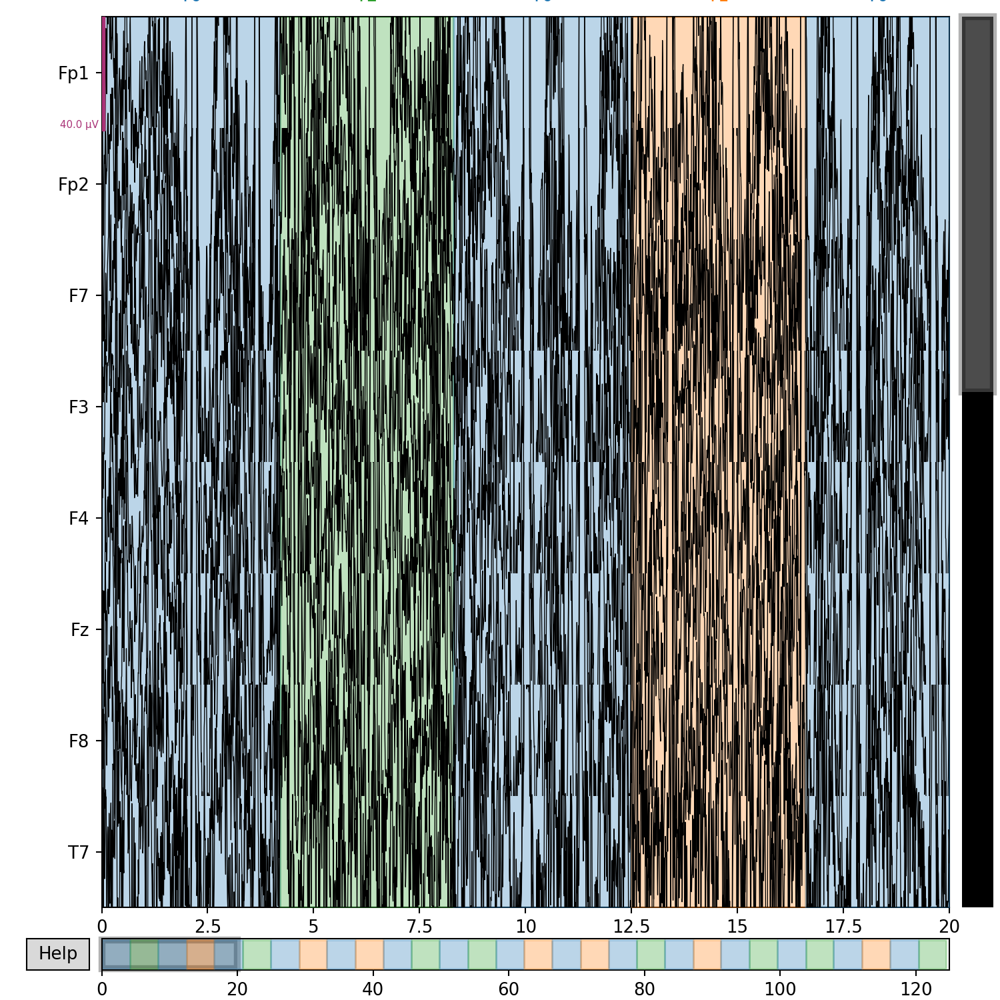

In [22]:
sample_1020.plot(n_channels=8, duration=20);

In [23]:
# Plot in better scale. Use 'scaling' argument

# YOUR CODE HERE

## Extracting events

Mne has several functions for event selection. 

* `mne.find_events` is used when events are stored in trigger channels (e.g. FIFF format)
* `mne.events_from_annotations` is used for when events are stored in annotations (EDF+ format)
    
Look for documentation for your EEG-record format

Here we have EDF+ format

In [24]:
events, events_dict = mne.events_from_annotations(sample_1020)

Used Annotations descriptions: ['T0', 'T1', 'T2']


In [25]:
events_dict

{'T0': 1, 'T1': 2, 'T2': 3}

In [26]:
events[:5]

array([[   0,    0,    1],
       [ 672,    0,    3],
       [1328,    0,    1],
       [2000,    0,    2],
       [2656,    0,    1]])

In [27]:
epochs = mne.Epochs(sample_1020, events,  tmin=-0.5, tmax=0.8, preload=True)

Not setting metadata
30 matching events found
Setting baseline interval to [-0.5, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 30 events and 209 original time points ...
1 bad epochs dropped


In [28]:
pd.DataFrame(epochs.events, columns=['_', '__', 'event_id'])['event_id'].value_counts()

event_id
1    14
3     8
2     7
Name: count, dtype: int64

Check that length is right

In [29]:
for epoch in epochs:
    break
epoch.shape

(19, 209)

In [30]:
epoch.shape[1] / sample_1020.info['sfreq']

1.30625

In [31]:
sample_1020.to_data_frame().shape

(20000, 20)

In [32]:
df = epochs.to_data_frame()
df.head(3).iloc[:, :10]

,time,condition,epoch,Fp1,Fp2,F7,F3,F4,Fz,F8
0,-0.50000,3,1,236.675891,244.275703,125.936913,88.829681,112.445086,73.438632,145.805904
1,-0.49375,3,1,175.970007,183.425016,103.803572,63.009365,82.687750,48.730906,115.749079
2,-0.48750,3,1,127.095181,132.985975,61.669835,31.478465,62.299189,33.384794,93.870855


<IPython.core.display.Javascript object>


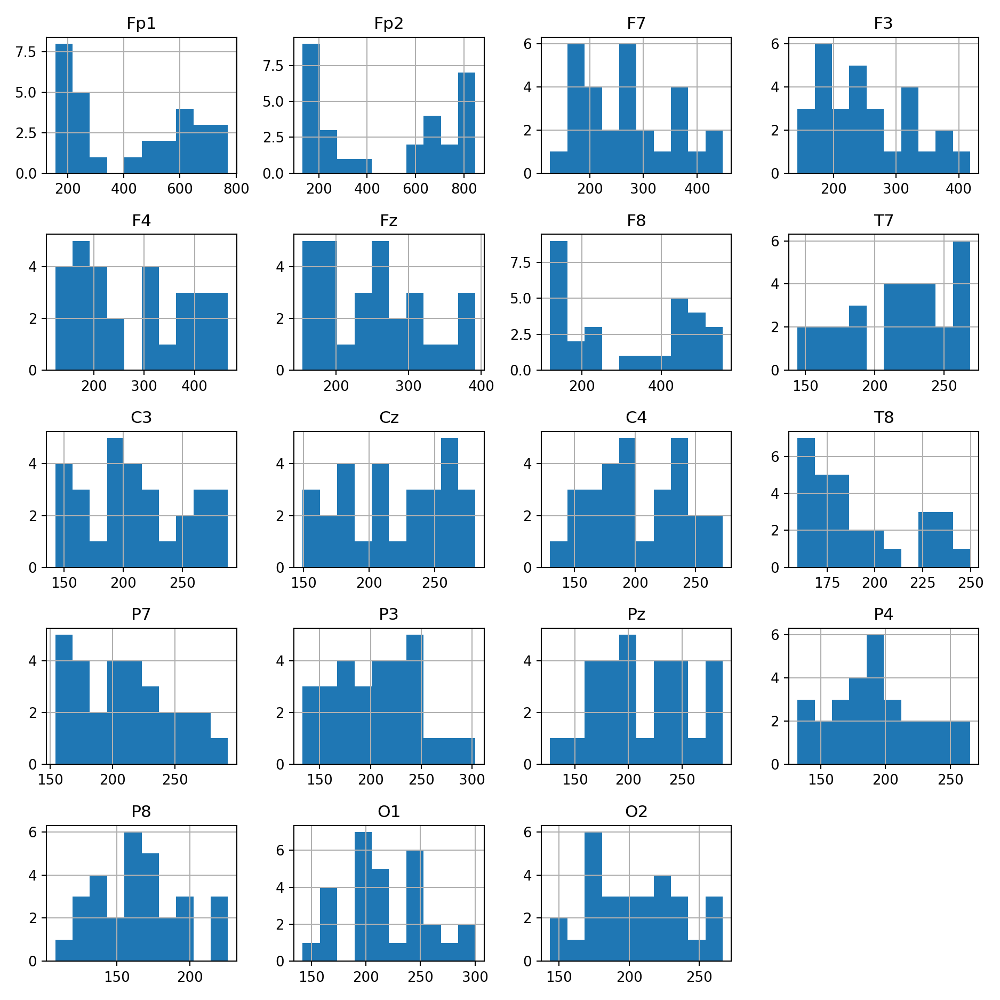

In [33]:
df[sample_1020.ch_names + ['epoch']].groupby('epoch').agg(lambda arr: arr.max() - arr.min()).hist(figsize=[10, 10]);
plt.tight_layout()

In [35]:
epochs = mne.Epochs(sample_1020, events,  tmin=-0.5, tmax=0.8, reject={'eeg': 600e-6}, preload=True, baseline=(-.1, 0))

Not setting metadata
30 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 30 events and 209 original time points ...
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
15 bad epochs dropped


PSD on epochs differs from the raw. More averaging is used

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Plotting power spectral density (dB=True).
Averaging across epochs...


C:\Users\ALEXAN~1\AppData\Local\Temp/ipykernel_19568/2204970765.py:1: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  epochs.plot_psd();


<IPython.core.display.Javascript object>


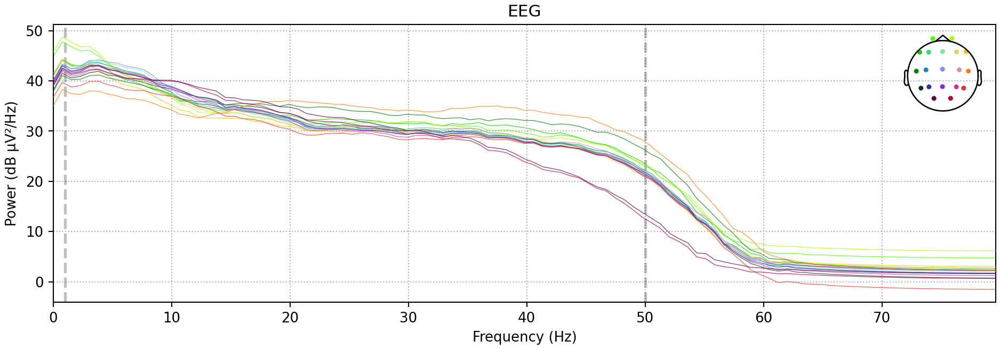

In [36]:
epochs.plot_psd();

<IPython.core.display.Javascript object>


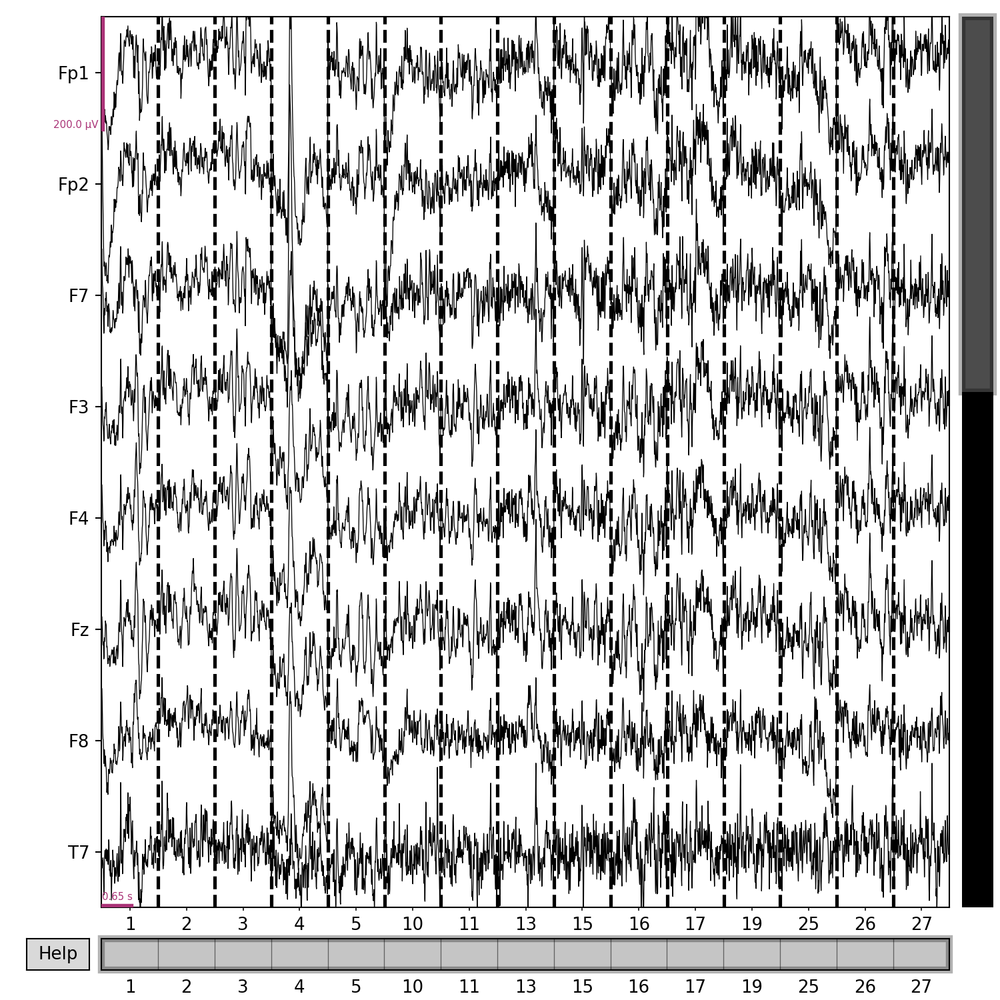

In [40]:
epochs.plot(n_channels=8, scalings={'eeg':1e-4});

In [41]:
epochs.event_id

{'1': 1, '2': 2, '3': 3}

In [42]:
# check number of events of each type
# use epochs.events

# Your code here

pd.DataFrame(epochs.events, columns=['_', '__', 'event_id'])['event_id'].value_counts()

event_id
3    6
1    5
2    4
Name: count, dtype: int64

In [43]:
evoked_T0 = epochs['1'].average()
evoked_T1 = epochs['2'].average()
evoked_T2 = epochs['3'].average()

<IPython.core.display.Javascript object>


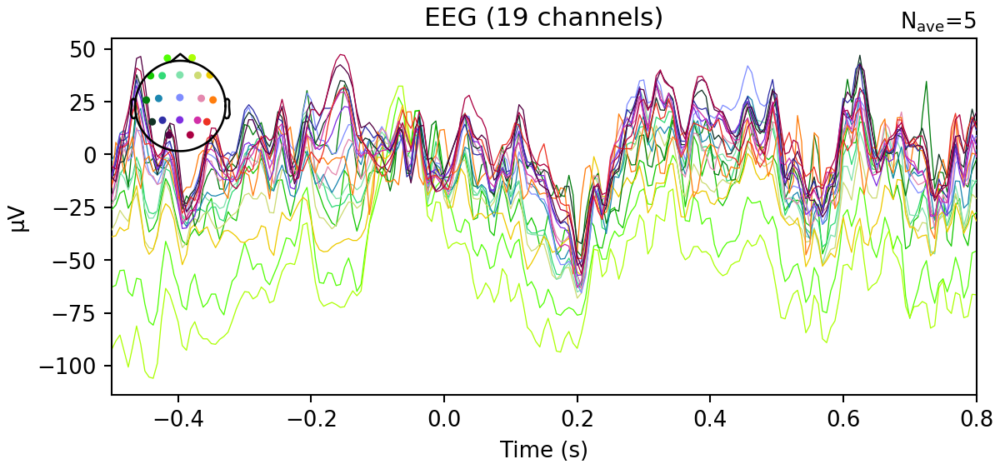

In [44]:
evoked_T0.plot(spatial_colors=True);

<IPython.core.display.Javascript object>


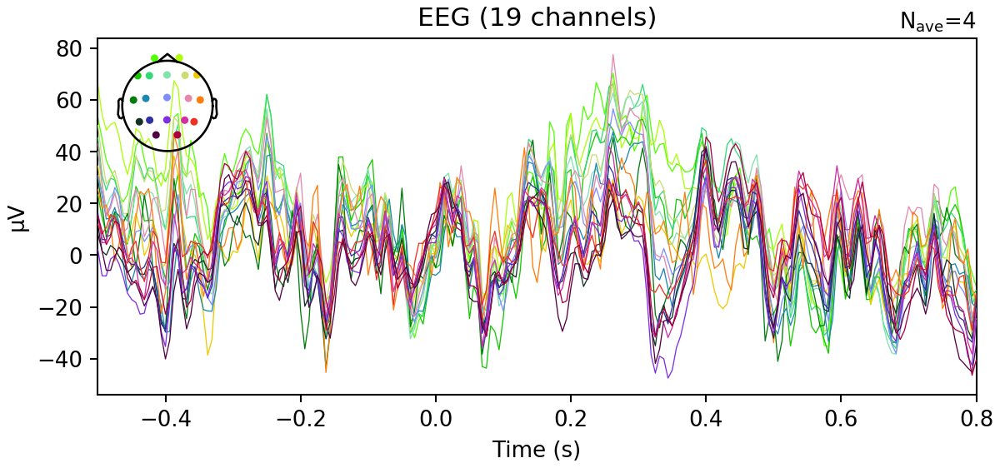

In [45]:
evoked_T1.plot(spatial_colors=True);

<IPython.core.display.Javascript object>


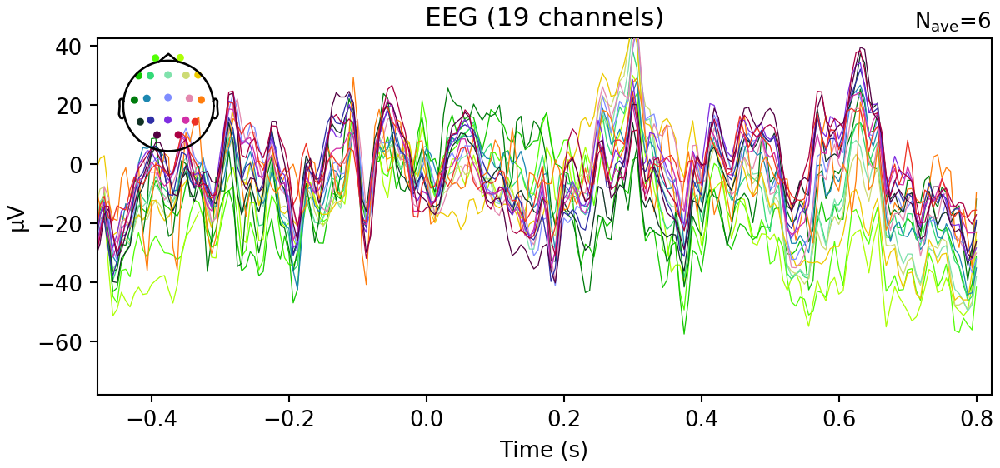

In [46]:
evoked_T2.plot(spatial_colors=True);

## Independent Component Analysis for Artifact Removal

In [47]:
ica = mne.preprocessing.ICA(n_components=10, random_state=42)

In [48]:
ica.fit(sample_1020)

Fitting ICA to data using 19 channels (please be patient, this may take a while)
Selecting by number: 10 components
Fitting ICA took 0.4s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,17 iterations on raw data (20000 samples)
ICA components,10
Available PCA components,19
Channel types,eeg
ICA components marked for exclusion,—


Creating RawArray with float64 data, n_channels=10, n_times=20000
    Range : 0 ... 19999 =      0.000 ...   124.994 secs
Ready.


<IPython.core.display.Javascript object>


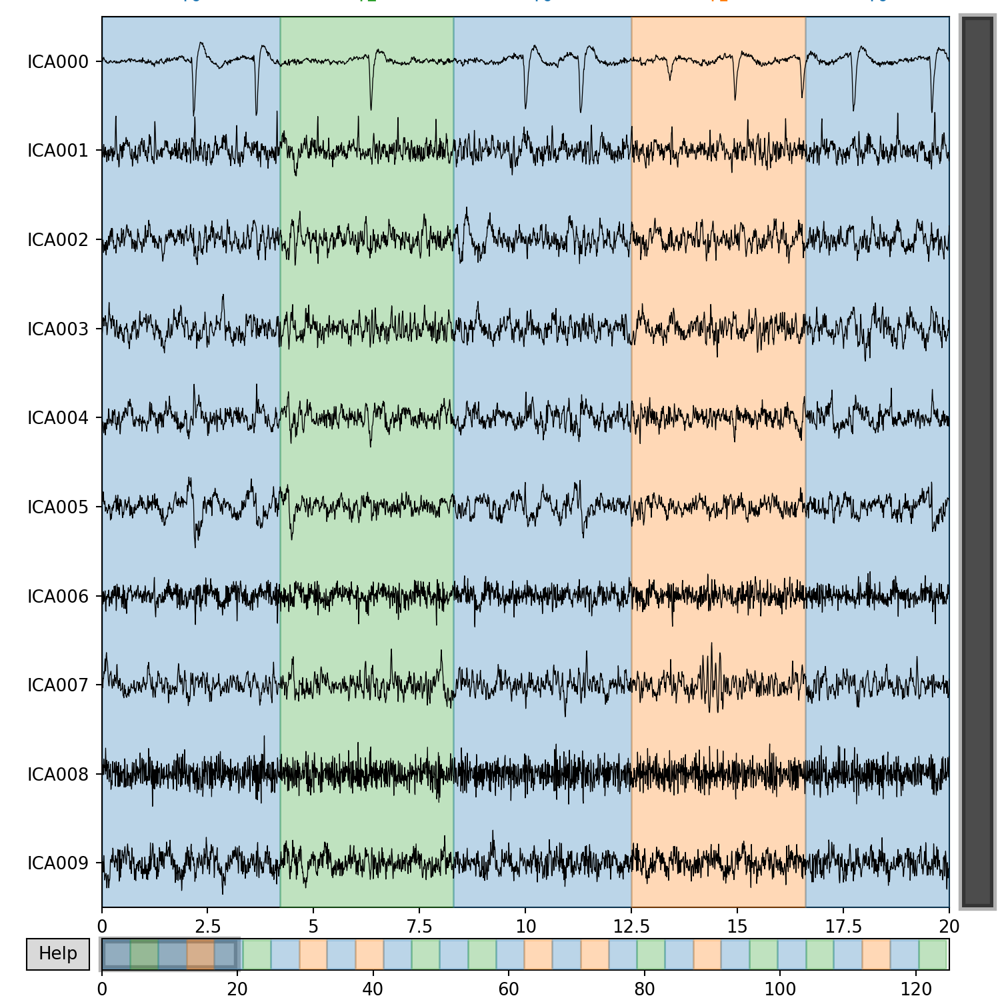

In [49]:
ica.plot_sources(sample_1020);

<IPython.core.display.Javascript object>


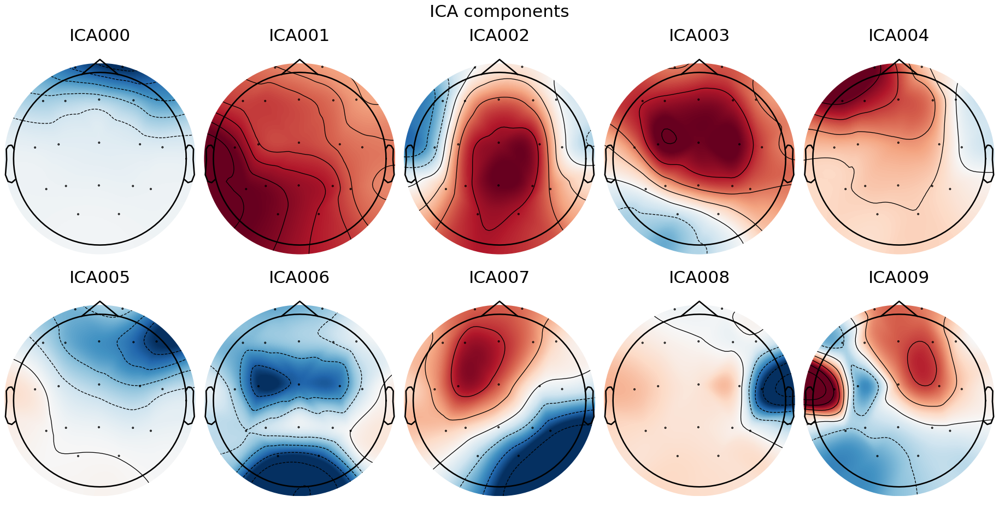

In [50]:
ica.plot_components();

Inspect ICA components more deeply. Check out spectrogram. Segments info is not very relevant here since we build ICA on the raw data

We expect to see alpha and beta rythms picks on the spectrogram for good components (7-13 Hz and 13-30Hz respectively). And also slight decrease as frequency goes higher

<IPython.core.display.Javascript object>


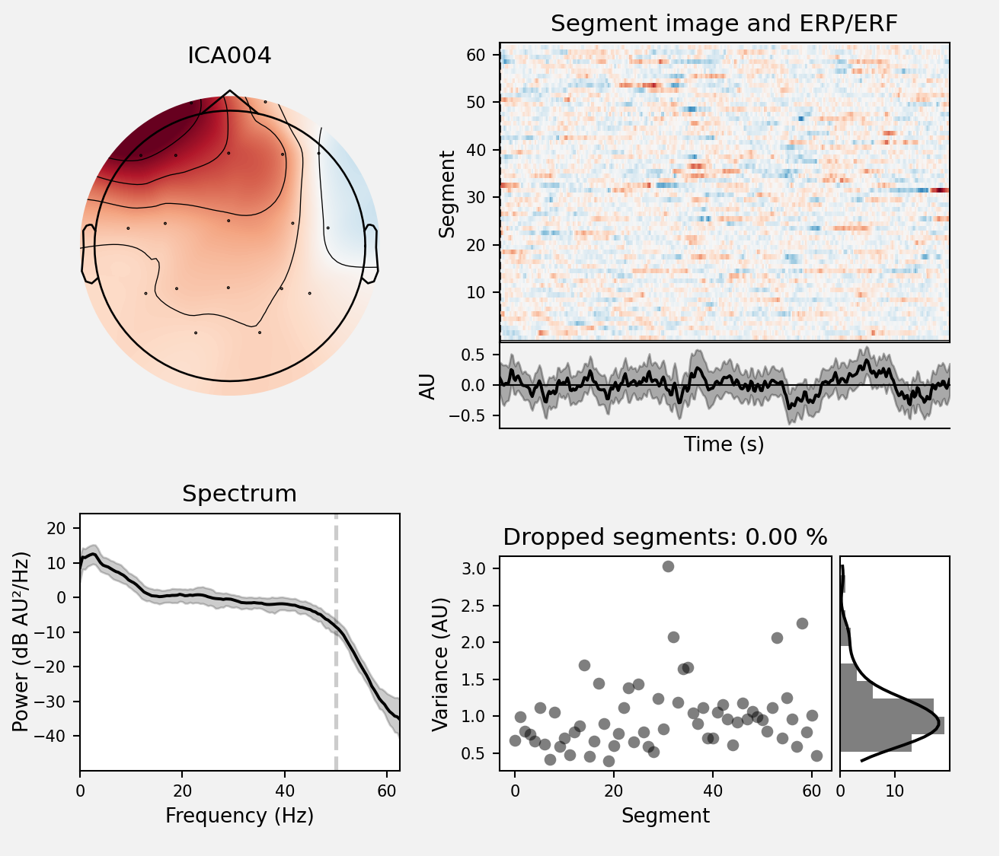

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
62 matching events found
No baseline correction applied
0 projection items activated


In [52]:
ica.plot_properties(sample_1020, picks=[4]);

Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 6 ICA components
    Projecting back using 19 PCA components


<IPython.core.display.Javascript object>


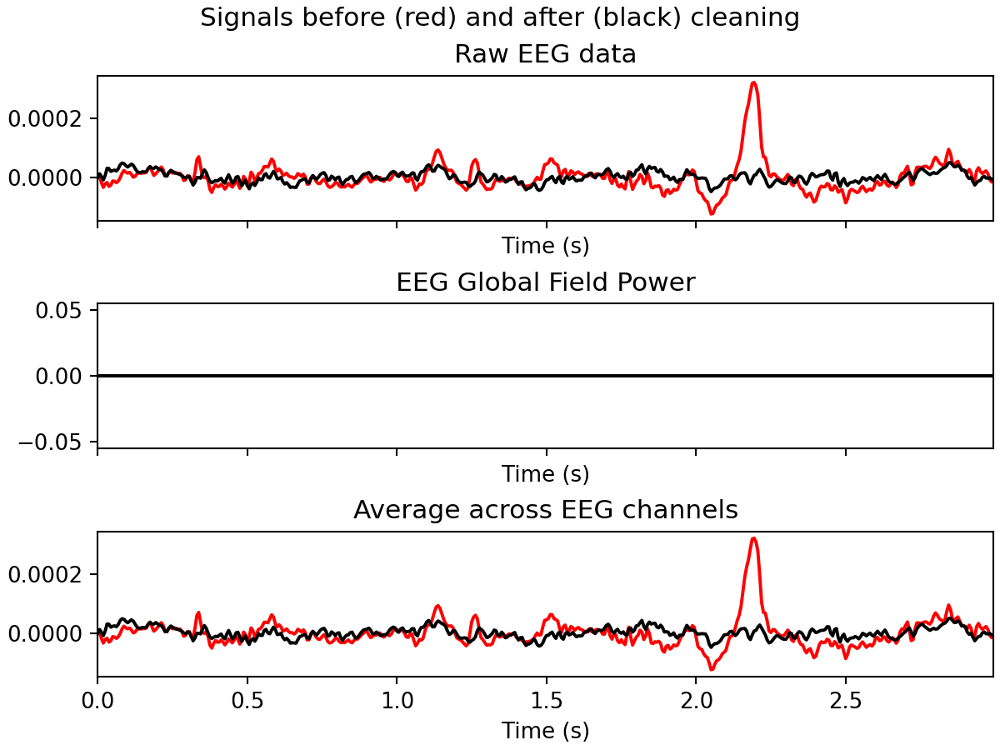

In [53]:
ica.plot_overlay(sample_1020, exclude=[0, 1, 4, 5, 8, 9], picks=['F3']);

In [66]:
ica.exclude = [0, 1]

In [55]:
sample_1020_clr = sample_1020.copy()

In [56]:
ica.apply(sample_1020_clr)

Applying ICA to Raw instance
    Transforming to ICA space (10 components)
    Zeroing out 2 ICA components
    Projecting back using 19 PCA components


Measurement date,"August 12, 2009 16:15:00 GMT"
Experimenter,Unknown
Participant,X
Digitized points,22 points
Good channels,19 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,160.00 Hz
Highpass,1.00 Hz
Lowpass,50.00 Hz


In [57]:
# plot channels

# YOUR CODE HERE


In [58]:
epochs = mne.Epochs(sample_1020_clr, events,  tmin=-0.5, tmax=0.8, reject={'eeg': 600e-6}, preload=True, baseline=(-.1, 0))


Not setting metadata
30 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 30 events and 209 original time points ...
1 bad epochs dropped


In [59]:
evoked_T0 = epochs['1'].average()
evoked_T1 = epochs['2'].average()
evoked_T2 = epochs['3'].average()

<IPython.core.display.Javascript object>


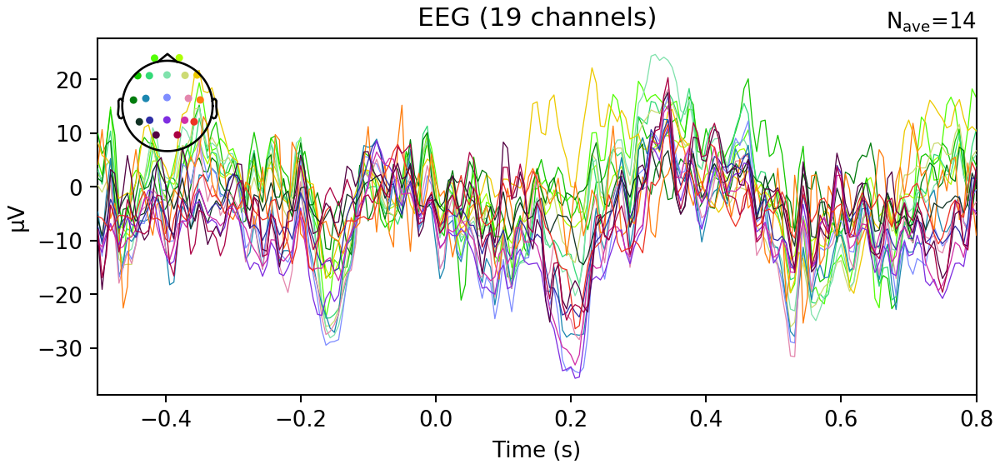

In [60]:
evoked_T0.plot(spatial_colors=True);

<IPython.core.display.Javascript object>


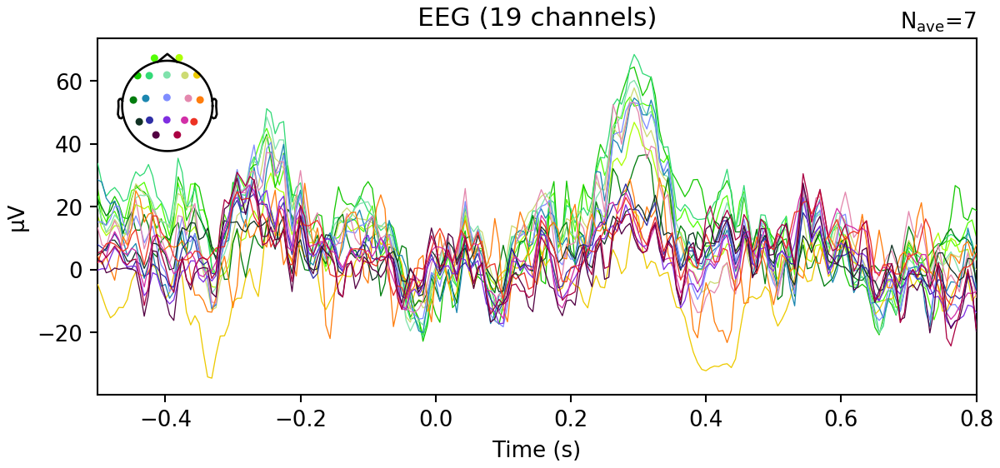

In [61]:
evoked_T1.plot(spatial_colors=True);

<IPython.core.display.Javascript object>


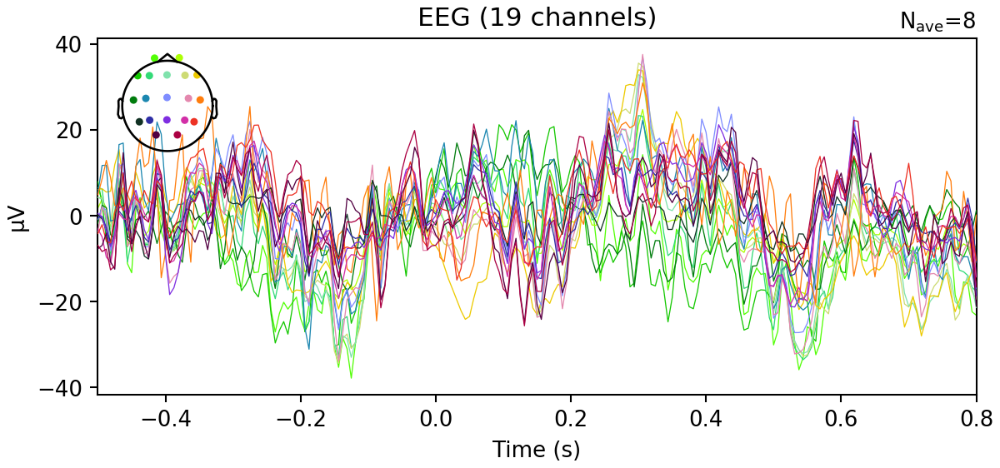

In [67]:
evoked_T2.plot(spatial_colors=True);

<IPython.core.display.Javascript object>


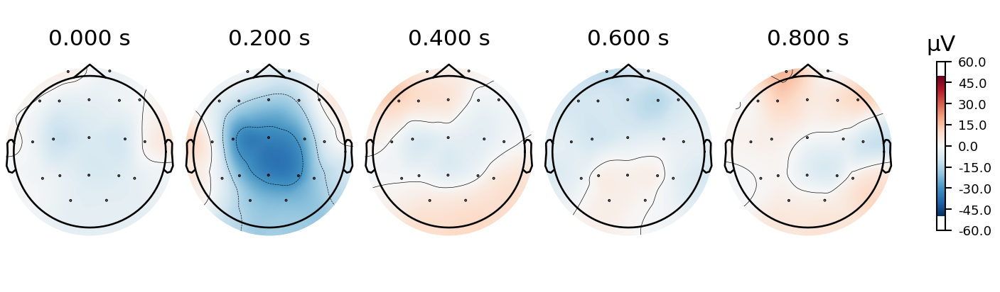

In [68]:
evoked_T0.plot_topomap(times=[0, .2, .4, .6, .8], vlim=(-50,50));

C:\Users\Alexander\anaconda3\lib\site-packages\mne\viz\_mpl_figure.py:2365: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(FigureClass=FigureClass, **kwargs)


<IPython.core.display.Javascript object>


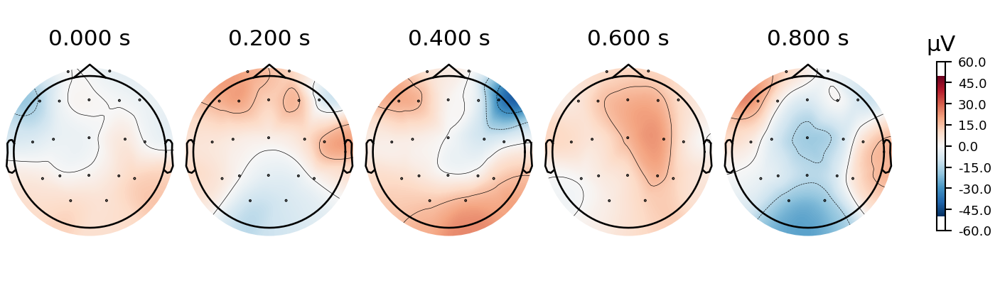

In [69]:
evoked_T1.plot_topomap(times=[0, .2, .4, .6, .8], vlim=(-50,50));

<IPython.core.display.Javascript object>


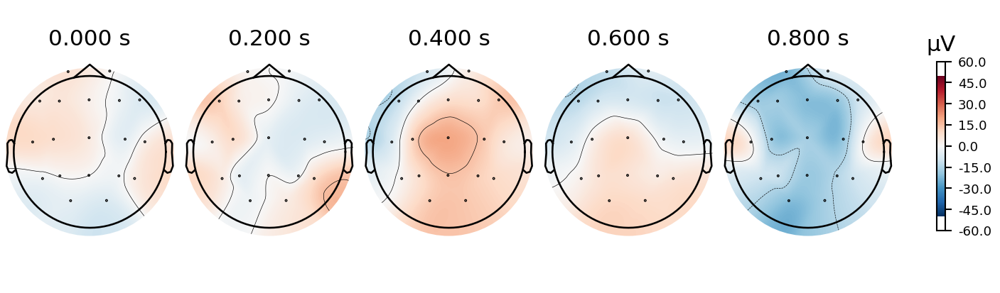

In [70]:
evoked_T2.plot_topomap(times=[0, .2, .4, .6, .8], vlim=(-50,50));

## Dynamics of alpha and beta activity

In [71]:
evoked_T0_alpha = evoked_T0.copy().filter(l_freq=7, h_freq=13, method='iir', verbose=False).apply_hilbert(envelope=True)
evoked_T1_alpha = evoked_T1.copy().filter(l_freq=7, h_freq=13, method='iir', verbose=False).apply_hilbert(envelope=True)
evoked_T2_alpha = evoked_T2.copy().filter(l_freq=7, h_freq=13, method='iir', verbose=False).apply_hilbert(envelope=True)


<IPython.core.display.Javascript object>


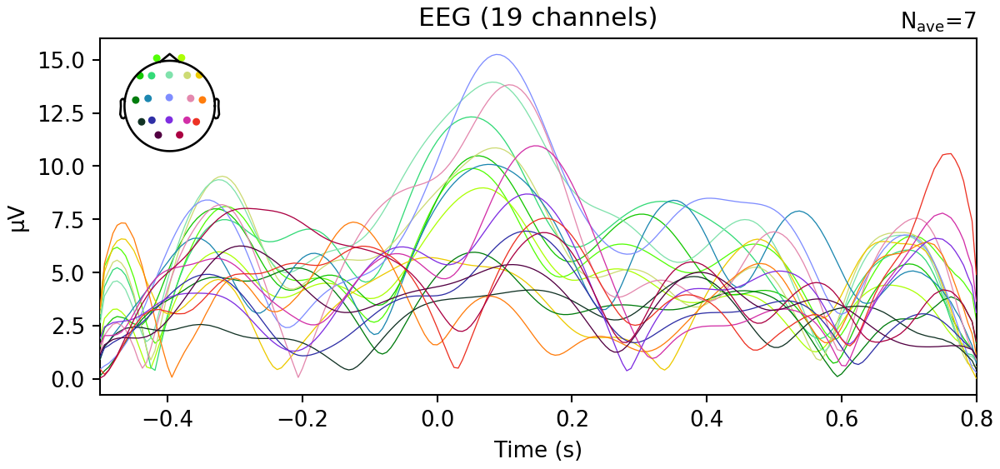

In [72]:
evoked_T1_alpha.plot(spatial_colors=True);

C:\Users\Alexander\anaconda3\lib\site-packages\mne\viz\_mpl_figure.py:2365: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(FigureClass=FigureClass, **kwargs)


<IPython.core.display.Javascript object>


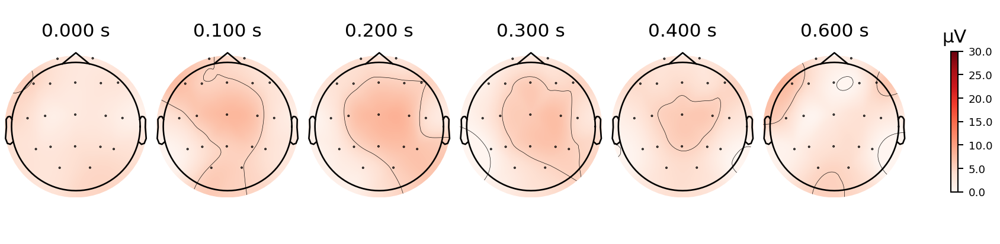

In [73]:
evoked_T0_alpha.plot_topomap(times=[0, .1, .2, .3, .4, .6], vlim=(0,30));

<IPython.core.display.Javascript object>


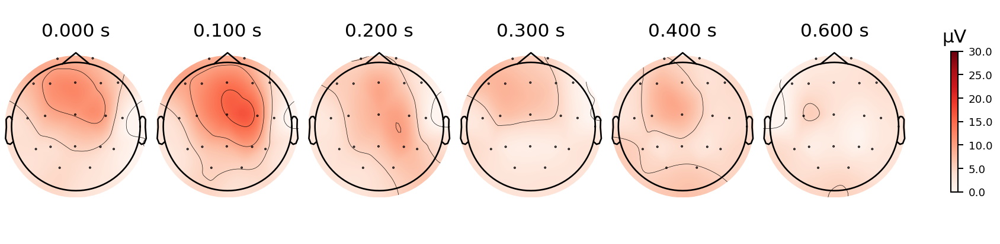

In [74]:
evoked_T1_alpha.plot_topomap(times=[0, .1, .2, .3, .4, .6], vlim=(0,30));

<IPython.core.display.Javascript object>


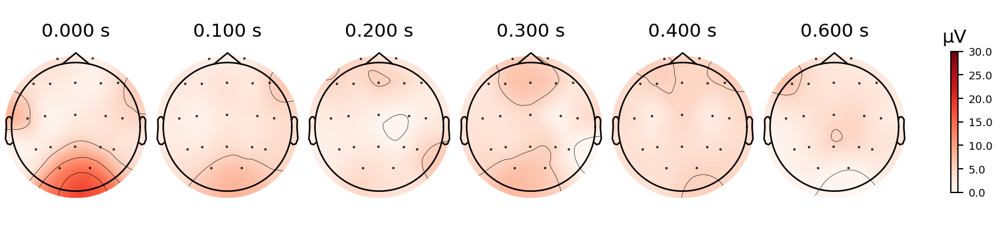

In [75]:
evoked_T2_alpha.plot_topomap(times=[0, .1, .2, .3, .4, .6], vlim=(0,30));

In [76]:
evoked_T0_beta_low = evoked_T0.copy().filter(l_freq=13, h_freq=20, method='iir', verbose=False).apply_hilbert(envelope=True)
evoked_T1_beta_low = evoked_T1.copy().filter(l_freq=13, h_freq=20, method='iir', verbose=False).apply_hilbert(envelope=True)
evoked_T2_beta_low = evoked_T2.copy().filter(l_freq=13, h_freq=20, method='iir', verbose=False).apply_hilbert(envelope=True)


<IPython.core.display.Javascript object>


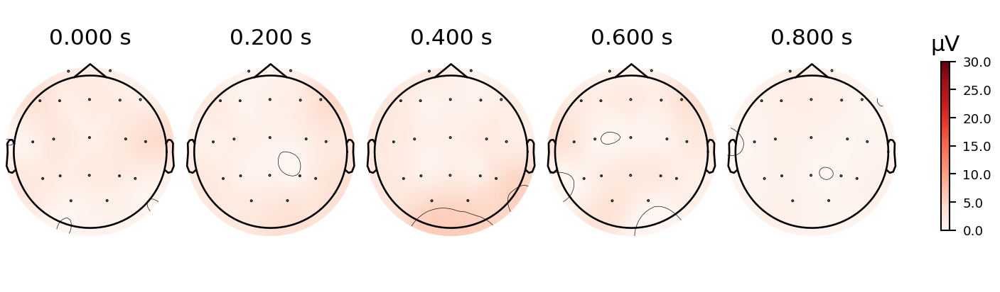

In [77]:
evoked_T0_beta_low.plot_topomap(times=[0, .2, .4, .6, .8], vlim=(0,30));

<IPython.core.display.Javascript object>


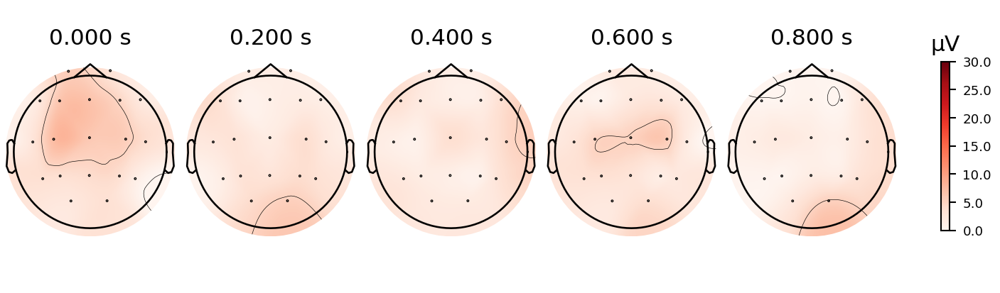

In [78]:
evoked_T1_beta_low.plot_topomap(times=[0, .2, .4, .6, .8], vlim=(0,30));

<IPython.core.display.Javascript object>


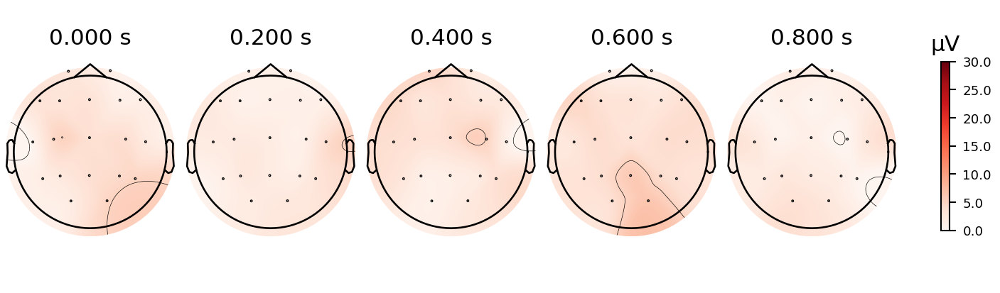

In [79]:
evoked_T2_beta_low.plot_topomap(times=[0, .2, .4, .6, .8], vlim=(0,30));

## Computing functional connectivity

In [84]:
conn_T1 = mne_connectivity.spectral_connectivity_epochs(epochs['2'], method='coh')

Adding metadata with 3 columns
Connectivity computation...
only using indices for lower-triangular matrix
    computing connectivity for 171 connections
    using t=-0.500s..0.800s for estimation (209 points)
    frequencies: 4.6Hz..79.6Hz (99 points)
    Using multitaper spectrum estimation with 7 DPSS windows
    the following metrics will be computed: Coherence
    computing cross-spectral density for epoch 1
    computing cross-spectral density for epoch 2
    computing cross-spectral density for epoch 3
    computing cross-spectral density for epoch 4
    computing cross-spectral density for epoch 5
    computing cross-spectral density for epoch 6
    computing cross-spectral density for epoch 7
    assembling connectivity matrix
[Connectivity computation done]


In [85]:
def plot_topomap_connectivity_2d(info, con, picks=None, pairs=None, vmin=None, vmax=None, cm=None, show_values=False, show_names=True):
    """
    Plots connectivity-like data in 2d
    
    Drawing every pair of channels will likely make a mess
    There are two options to avoid it:
    - provide picks
    - provide specific pairs of channels to draw
    """
    
    # get positions
    _, pos, _, _, _, _, _ = mne.viz.topomap._prepare_topomap_plot(info, 'eeg');
    
#     if picks is None and pairs is None:
#         picks = info.ch_names
    
    ch_names_lower = [ch.lower() for ch in info.ch_names]
    if picks:
        picks_lower = [ch.lower() for ch in picks]
    if pairs:
        pairs_lower = [tuple(sorted([ch1.lower(), ch2.lower()])) for ch1, ch2 in pairs]
    
    rows = []
    for idx1, ch1 in enumerate(ch_names_lower):
        for idx2, ch2 in enumerate(ch_names_lower):
            if ch1 >= ch2:
                continue
            if picks and (ch1 not in picks_lower or ch2 not in picks_lower):
                    continue
            if pairs and (ch1, ch2) not in pairs_lower:
                    continue
            rows.append((
                pos[idx1],
                pos[idx2],
                con[idx1, idx2]
            ))
    
    if not len(rows):
        raise ValueError('No pairs to plot')
    
    con_to_plot = np.array([row[2] for row in rows])
    if vmin is None:
        vmin = np.percentile(con_to_plot, 2)
    if vmax is None:
        vmax = np.percentile(con_to_plot, 98)
    norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)
    
    if cm is None:
        cm = sns.diverging_palette(240, 10, as_cmap=True)
    
    fig, ax = plt.subplots(figsize=[5, 5])
    mne.viz.utils.plot_sensors(info, show_names=show_names, show=False, axes=ax);
    for row in rows:
        rgba_color = cm(norm(row[2]))
        plt.plot([row[0][0], row[1][0]], [row[0][1], row[1][1]], color=rgba_color)
        if show_values:
            plt.text((row[0][0] + row[1][0]) / 2, 
                     (row[0][1] + row[1][1]) / 2, 
                     '{:.2f}'.format(row[2]))

In [86]:
conn_T0 = mne_connectivity.spectral_connectivity_epochs(epochs['1'], method='coh', verbose=False);
conn_T1 = mne_connectivity.spectral_connectivity_epochs(epochs['2'], method='coh', verbose=False);
conn_T2 = mne_connectivity.spectral_connectivity_epochs(epochs['3'], method='coh', verbose=False);

In [100]:
conn_T0.freqs

[4.593301435406698,
 5.358851674641148,
 6.124401913875597,
 6.8899521531100465,
 7.655502392344497,
 8.421052631578947,
 9.186602870813395,
 9.952153110047846,
 10.717703349282296,
 11.483253588516744,
 12.248803827751194,
 13.014354066985645,
 13.779904306220093,
 14.545454545454543,
 15.311004784688993,
 16.076555023923444,
 16.842105263157894,
 17.60765550239234,
 18.37320574162679,
 19.13875598086124,
 19.90430622009569,
 20.66985645933014,
 21.43540669856459,
 22.200956937799038,
 22.96650717703349,
 23.73205741626794,
 24.49760765550239,
 25.26315789473684,
 26.02870813397129,
 26.79425837320574,
 27.559808612440186,
 28.325358851674636,
 29.090909090909086,
 29.856459330143537,
 30.622009569377987,
 31.387559808612437,
 32.15311004784689,
 32.91866028708134,
 33.68421052631579,
 34.44976076555023,
 35.21531100478468,
 35.98086124401913,
 36.74641148325358,
 37.51196172248803,
 38.27751196172248,
 39.04306220095693,
 39.80861244019138,
 40.57416267942583,
 41.33971291866028,
 42

In [101]:
conn_T0_beta = conn_T0.get_data(output="dense")[:, :, 12:27].mean(axis=2)
conn_T0_beta = conn_T0_beta + conn_T0_beta.T

conn_T1_beta = conn_T1.get_data(output="dense")[:, :, 12:27].mean(axis=2)
conn_T1_beta = conn_T1_beta + conn_T1_beta.T

conn_T2_beta = conn_T2.get_data(output="dense")[:, :, 12:27].mean(axis=2)
conn_T2_beta = conn_T2_beta + conn_T2_beta.T

<IPython.core.display.Javascript object>


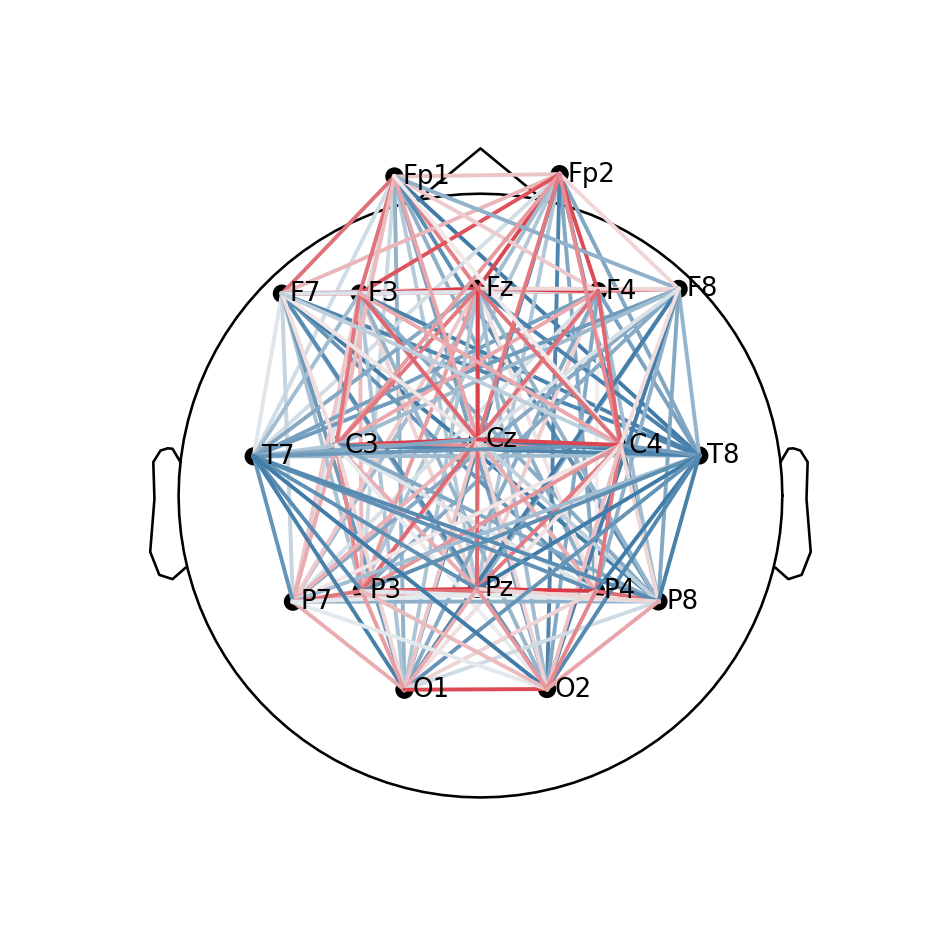

In [102]:
plot_topomap_connectivity_2d(epochs.info, conn_T1_beta, picks=epochs.ch_names);

<IPython.core.display.Javascript object>


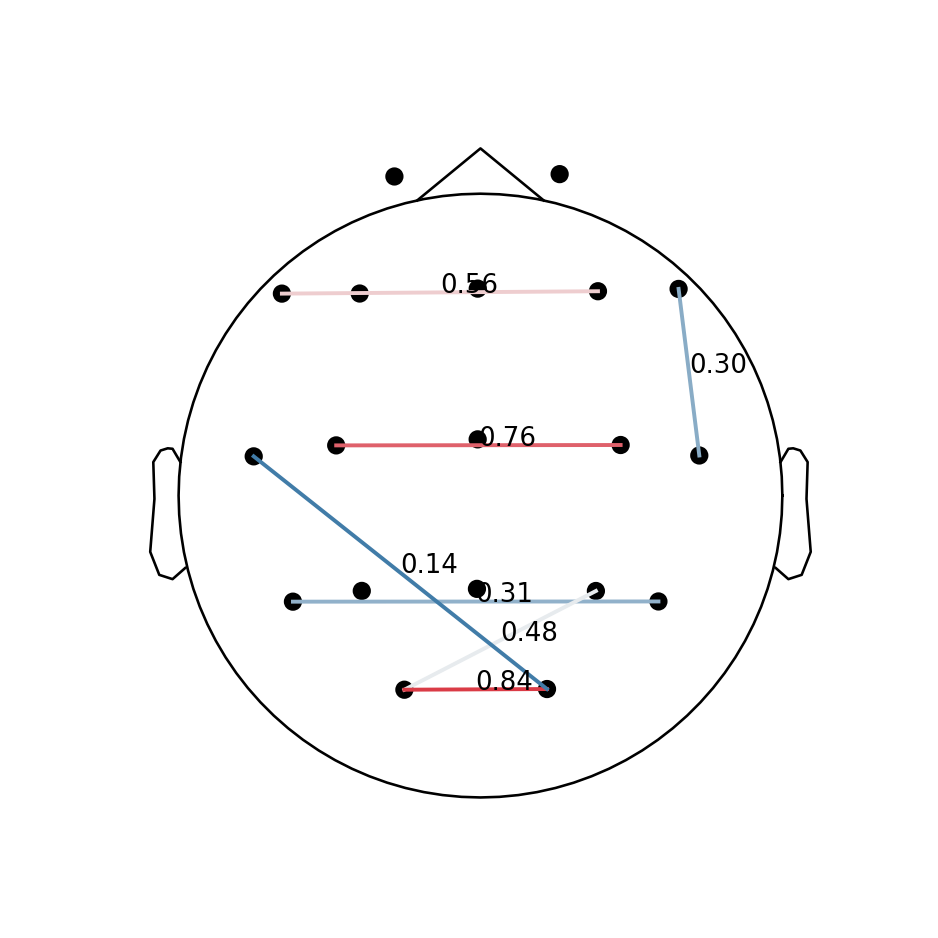

In [103]:
plot_topomap_connectivity_2d(epochs.info, conn_T0_beta, 
                             pairs=[('F7', 'F4'), ('O2', 'T7'), ('C3', 'C4'), ('P7', 'P8'), ('F8', 'T8'), ('O1', 'O2'), ('O1', 'P4')],
                             show_values=True,
                             show_names=False
                            
                            );


In [ ]:
# calculate coherence in alpha band
# plot 5-10 pairs that you are interested in

# YOUR CODE HERE